# 22.46 Procesamiento Adaptativo de Señales Aleatorias
## Trabajo Práctico N° 2

## Filtrado lineal óptimo
En este trabajo se modela la respuesta al impulso $h(n)$ de un sistema **parlante-habitación-micrófono**, asumiendo régimen estacionario. Para lo cual se analizan diversas alternativas de señales de sonido con las cuales excitar al sistema para medir el comportamiento del mismo a la salida. Se emplea esta información en un esquema de identificación de sistemas para modelar el comportamiento de este sistema físico desconocido. Finalmente, se busca aplicar el modelo obtenido para recuperar la señal.

#### **Grupo N° 1**
* Davidov, Gonzalo Joaquín
* Farall, Facundo David
* Kammann, Lucas Agustín
* Trozzo, Rafael Nicolás

# 1. Selección de señales de excitación $x_j(n)$
En esta sección se generan diferentes señales de sonido $x_j(n)$ que serán utilizadas para excitar al sistema parlante-habitación-micrófono, con el objetivo de medir la respuesta $y_j(n)$ de dicho sistema. Para todos los casos, se utilizará una frecuencia de muestreo $f_s = 48kHz$. Las muestras de sonido tendrá un intervalo de 10 segundos.

Por otro lado, se busca verificar visualmente que las señales de entrada y salida muestreadas se encuentren sincronizadas o, al menos, sin infringir la causalidad del evento.

In [16]:
import matplotlib.pyplot as plt

In [17]:
from scipy import signal

In [18]:
from scipy.io.wavfile import write

In [19]:
from scipy.io.wavfile import read

In [20]:
import numpy as np

In [21]:
import IPython

In [22]:
import seaborn as sns

In [23]:
sns.set_style('dark')
sns.set_context('paper')
sns.set_palette('flare')

In [24]:
def plot_input_and_output(x, y, size, title):
    """ Plot the input and the output of the physical system to visually compare them
        @param x Input samples
        @param y Output samples
        @param size Amount of samples to show
        @param title Title of the plot
    """
    # Create the subplots to layout the plots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 8))
    fig.suptitle(title, fontsize=20)
    
    # Plot the input samples
    ax1.plot(x[:size], color='blue')
    ax1.set_ylabel('$x(n)$', fontsize=18)
    ax1.set_xlabel('$n$', fontsize=18)
    ax1.grid()
    
    # Plot the output samples
    ax2.plot(y[:size], color='red')
    ax2.set_ylabel('$y(n)$', fontsize=18)
    ax2.set_xlabel('$n$', fontsize=18)
    ax2.grid()

In [25]:
# Define the time interval
fs = 48e3
time_interval = 10
t = np.linspace(0, time_interval, int(time_interval * fs))

## 1.1. Señal de voz
Para modelar el sistema físico desconocido (en este caso la habitación), es necesario que exista correlación entre la señal de entrada y la señal deseada, y sólo se podrá ajustar en aquellas frecuencias presentes simultáneamente en ambas señales. Por ende, en primer lugar es necesario que las señales utilizadas tengan el mayor contenido espectral posible. No se podrá estimar el comportamiento del sistema para aquellas frecuencias en donde no hay contenido espectral en la señal de prueba usada. En conclusión, es necesario una señal con la mayor cantidad de frecuencias posible, idealmente todas (las audibles).

Naturalmente, la respuesta impulsiva se podría medir a partir de excitar al sistema con un impulso o delta de dirac, y justamente presenta un espectro constante o plano, con contenido en todas las frecuencias. Por ende, la señal a escoger podría además tener características impulsivas. Esto es, aparición de tonos repentinos.

### 1.1.1. Señal entrante $x_1(n)$

In [26]:
fs_x_voice, x_voice = read('../resources/voice.wav')

In [27]:
IPython.display.Audio(x_voice, rate=fs_x_voice)

### 1.1.2. Señal saliente $y_1(n)$

In [35]:
fs_y_voice, y_voice = read('../resources/rec_voice.wav')

In [36]:
y_voice = y_voice[:len(x_voice)]

In [38]:
IPython.display.Audio(y_voice, rate=fs_y_voice)

### 1.1.3. Comparación $x_1(n)$ vs $y_1(n)$

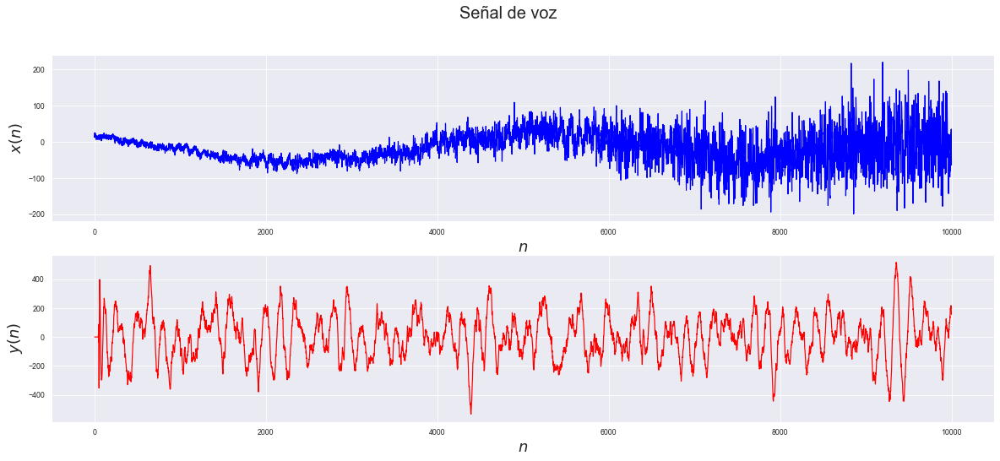

In [41]:
plot_input_and_output(x_voice, y_voice, 10000, 'Señal de voz')

## 1.2. Señal de música
Para la elección de la señal de música, se optó por utilizar la canción **Bohemian Rhapsody** de **Queen**. La razón por la cual se escogió esta canción en el entorno desde el minuto 3:45 al minuto 3:55, es porque en esa región se considera que se cumplen los criterios establecidos anteriormente.

### 1.2.1. Señal entrante $x_2(n)$

In [42]:
fs_x_music, x_music = read('../resources/music.wav')

In [43]:
IPython.display.Audio(x_music, rate=fs_x_music)

### 1.2.2. Señal entrante $y_2(n)$

In [44]:
fs_y_music, y_music = read('../resources/rec_music.wav')

In [45]:
y_music = y_music[:len(x_music)]

In [46]:
IPython.display.Audio(y_music, rate=fs_y_music)

### 1.2.3. Comparación $x_2(n)$ vs $y_2(n)$

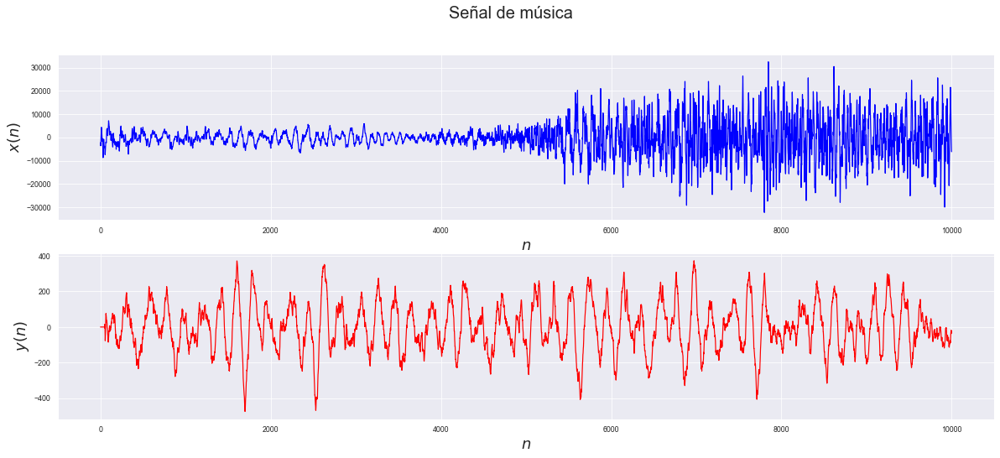

In [47]:
plot_input_and_output(x_music, y_music, 10000, 'Señal de música')

## 1.3. Señal rectangular

### 1.3.1. Señal entrante $x_3(n)$

In [48]:
f = 100
x_square = signal.square(2 * np.pi * f * t)

In [49]:
write('../resources/square.wav', int(fs), x_square.astype(np.float32))

In [50]:
IPython.display.Audio(x_square, rate=fs)

### 1.3.2. Señal saliente $y_3(n)$

In [57]:
fs_y_square, y_square = read('../resources/rec_square.wav')

In [58]:
y_square = y_square[:len(x_square)]

In [60]:
IPython.display.Audio(y_square, rate=fs_y_square)

### 1.3.3. Comparación $x_3(n)$ vs $y_3(n)$

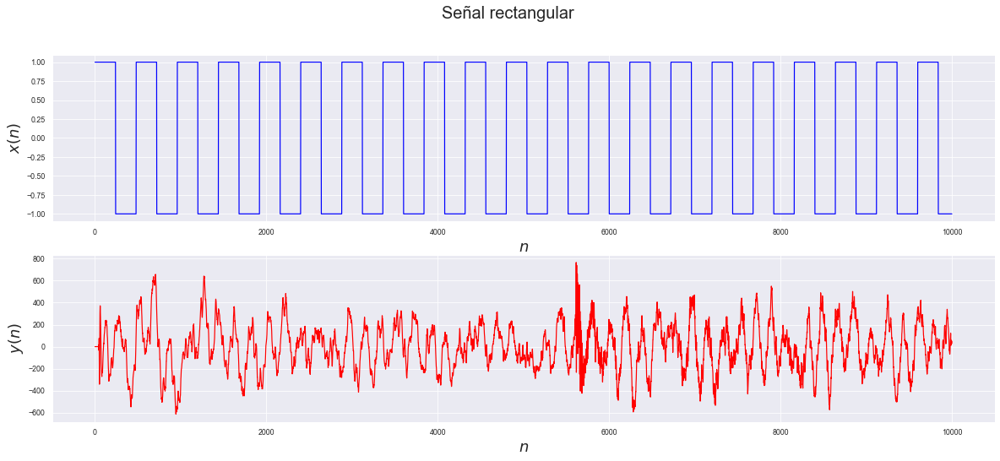

In [62]:
plot_input_and_output(x_square, y_square, 10000, 'Señal rectangular')

## 1.4. Barrido lineal de frecuencia

### 1.4.1. Señal entrante $x_4(n)$

In [63]:
f0 = 20
f1 = 20e3
x_linear_sweep = np.sin(2 * np.pi * f0 * t + np.pi * ((f1 - f0) / time_interval) * t**2)

In [64]:
write('../resources/linear_sweep.wav', int(fs), x_linear_sweep.astype(np.float32))

In [65]:
IPython.display.Audio(x_linear_sweep, rate=fs)

### 1.4.2. Señal saliente $y_4(n)$

In [66]:
fs_y_linear_sweep, y_linear_sweep = read('../resources/rec_linear_sweep.wav')

In [67]:
y_linear_sweep = y_linear_sweep[:len(x_linear_sweep)]

In [68]:
IPython.display.Audio(y_linear_sweep, rate=fs_y_linear_sweep)

### 1.4.3. Comparación $x_4(n)$ vs $y_4(n)$

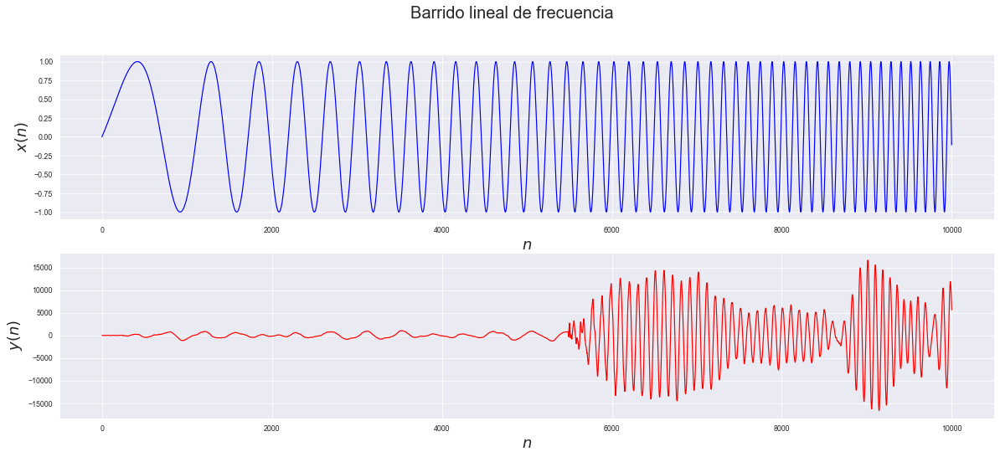

In [69]:
plot_input_and_output(x_linear_sweep, y_linear_sweep, 10000, 'Barrido lineal de frecuencia')

## 1.5. Barrido exponencial de frecuencia

### 1.5.1. Señal entrante $x_5(n)$

In [70]:
f0 = 20
f1 = 20e3
k = (f1 / f0)**(1 / time_interval)
x_exponential_sweep = np.sin(2 * np.pi * f0 * (k ** t - 1) / np.log(k))

In [71]:
write('../resources/exponential_sweep.wav', int(fs), x_exponential_sweep.astype(np.float32))

In [72]:
IPython.display.Audio(x_exponential_sweep, rate=fs)

### 1.5.2. Señal saliente $y_5(n)$

In [73]:
fs_y_exponential_sweep, y_exponential_sweep = read('../resources/rec_exponential_sweep.wav')

In [74]:
y_exponential_sweep = y_exponential_sweep[:len(x_exponential_sweep)]

In [75]:
IPython.display.Audio(y_exponential_sweep, rate=fs_y_exponential_sweep)

### 1.5.3. Comparación $x_5(n)$ vs $y_5(n)$

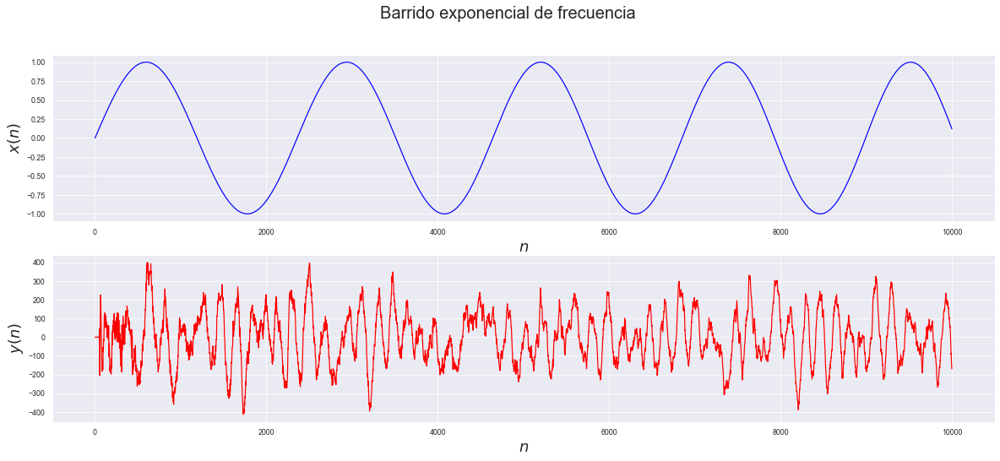

In [76]:
plot_input_and_output(x_exponential_sweep, y_exponential_sweep, 10000, 'Barrido exponencial de frecuencia')

## 1.6. Ruido blanco gaussiano

### 1.6.1. Señal entrante $x_6(n)$

In [77]:
mu = 0
sigma = 1
x_noise = np.random.normal(loc=mu, scale=sigma, size=len(t))

In [78]:
write('../resources/white_noise.wav', int(fs), x_noise.astype(np.float32))

In [79]:
IPython.display.Audio(x_noise, rate=fs)

### 1.6.2. Señal saliente $y_6(n)$

In [143]:
fs_y_noise, y_noise = read('../resources/rec_white_noise.wav')

In [144]:
y_noise = y_noise[:len(x_noise)]

In [145]:
IPython.display.Audio(y_noise, rate=fs_y_noise)

### 1.6.3. Comparación $x_6(n)$ vs $y_6(n)$

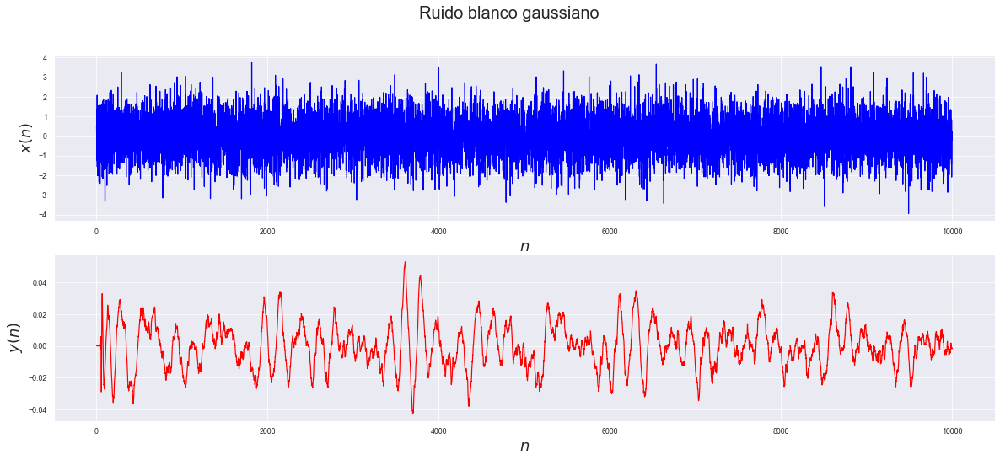

In [142]:
plot_input_and_output(x_noise, y_noise, 10000, 'Ruido blanco gaussiano')

# 2. Análisis de las excitaciones $x_i(n)$

In [84]:
from scipy import fft

In [85]:
def plot_periodograms(x, y, fs, title):
    """ Plot the power spectrum of the input signal and the desired response signal
        @param x Input signal
        @param y Desired response signal
        @param fs Sampling frequency
        @param title Title of the plot
    """
    # Estimate the power spectrum density
    fxx, Rxx = signal.welch(x, fs, nperseg=4096, scaling='spectrum', window='hanning')
    fyy, Ryy = signal.welch(y, fs, nperseg=4096, scaling='spectrum', window='hanning')
    
    # Plot the periodograms
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))
    fig.suptitle(title, fontsize=18)
    
    ax1.semilogy(fxx, Rxx, label='Espectro de potencia de entrada $x(n)$')
    ax1.set_xlabel('$f$ [Hz]', fontsize=18)
    ax1.set_ylabel('$R_{xx}$', fontsize=18)
    ax1.legend(fontsize=15)
    ax1.grid()
    
    ax2.semilogy(fyy, Ryy, label='Espectro de potencia de salida $y(n)$')
    ax2.set_xlabel('$f$ [Hz]', fontsize=18)
    ax2.set_ylabel('$R_{xx}$', fontsize=18)
    ax2.legend(fontsize=15)
    ax2.grid()
    
    plt.show()

## 2.1. Estimación espectral

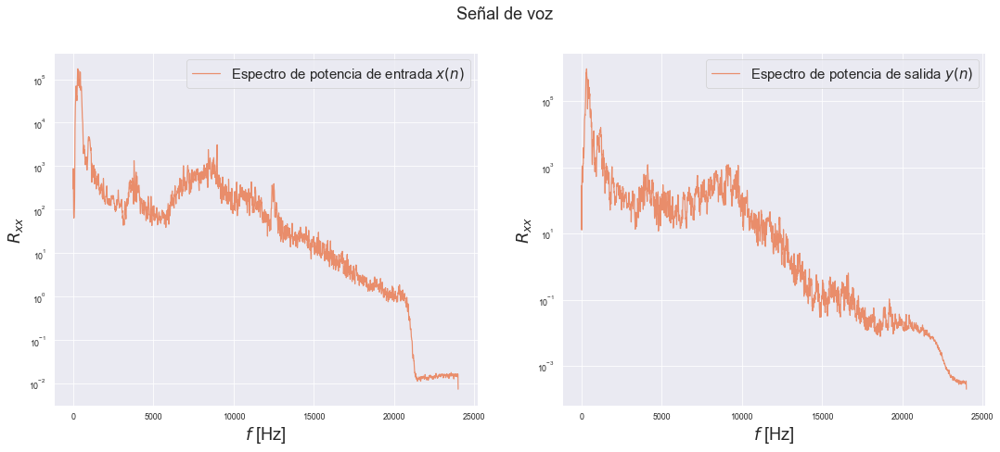

In [86]:
plot_periodograms(x_voice, y_voice, fs, 'Señal de voz')

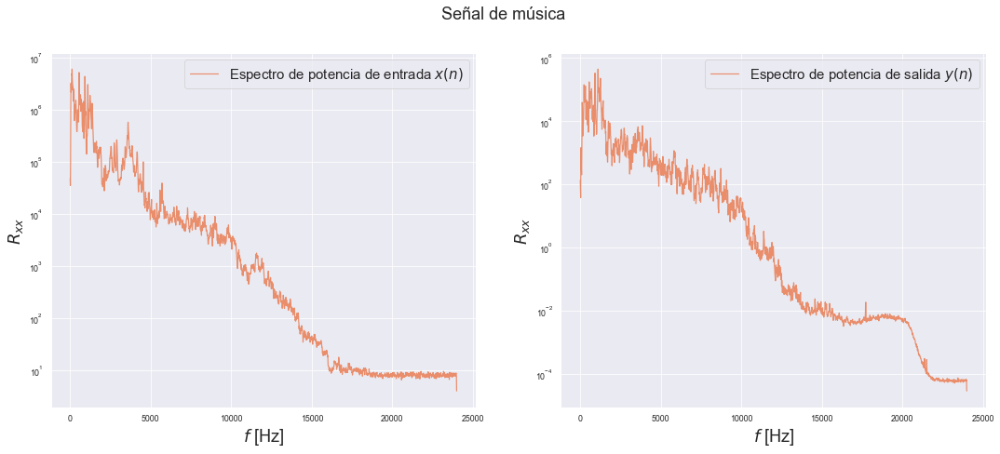

In [87]:
plot_periodograms(x_music, y_music, fs, 'Señal de música')

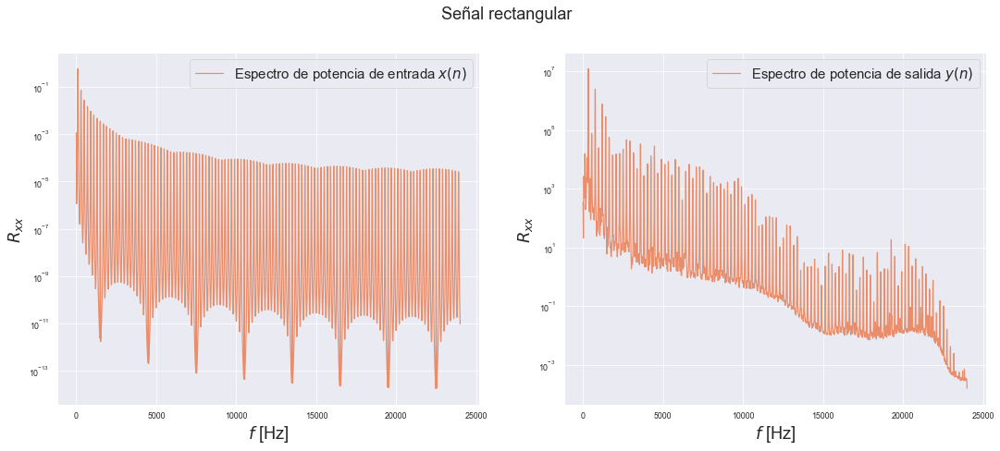

In [88]:
plot_periodograms(x_square, y_square, fs, 'Señal rectangular')

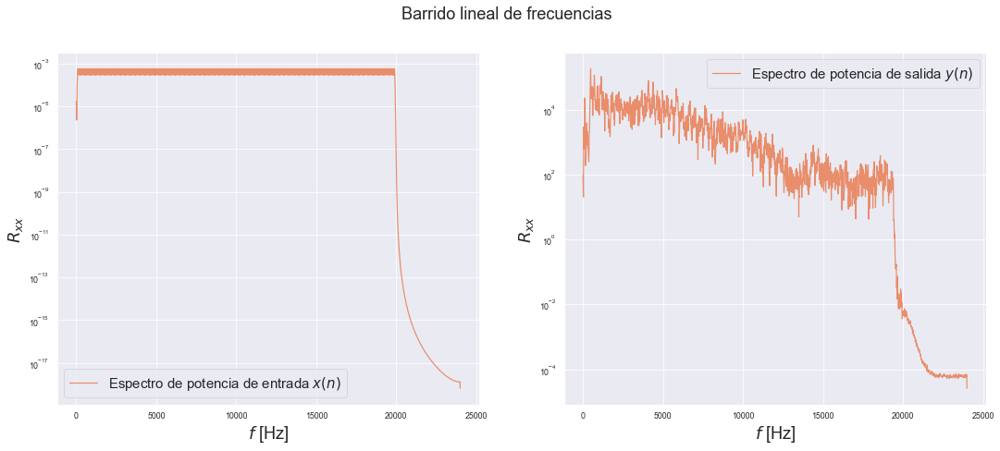

In [89]:
plot_periodograms(x_linear_sweep, y_linear_sweep, fs, 'Barrido lineal de frecuencias')

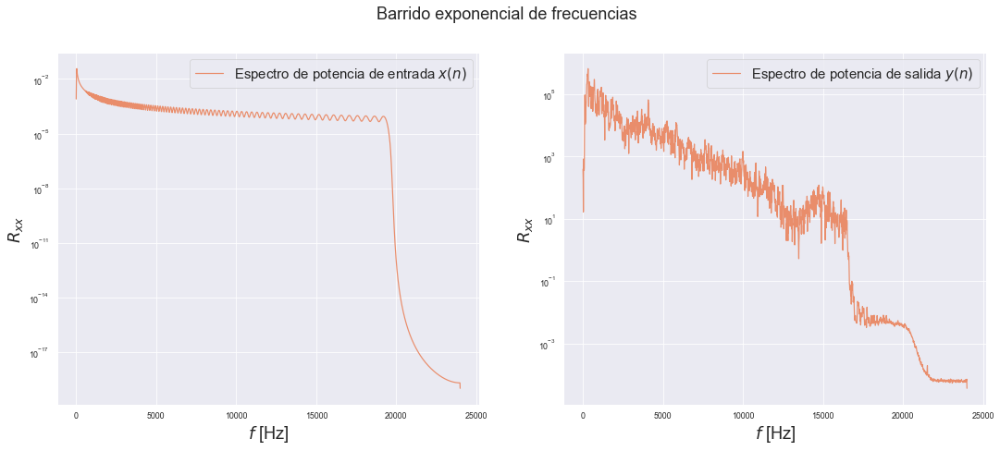

In [90]:
plot_periodograms(x_exponential_sweep, y_exponential_sweep, fs, 'Barrido exponencial de frecuencias')

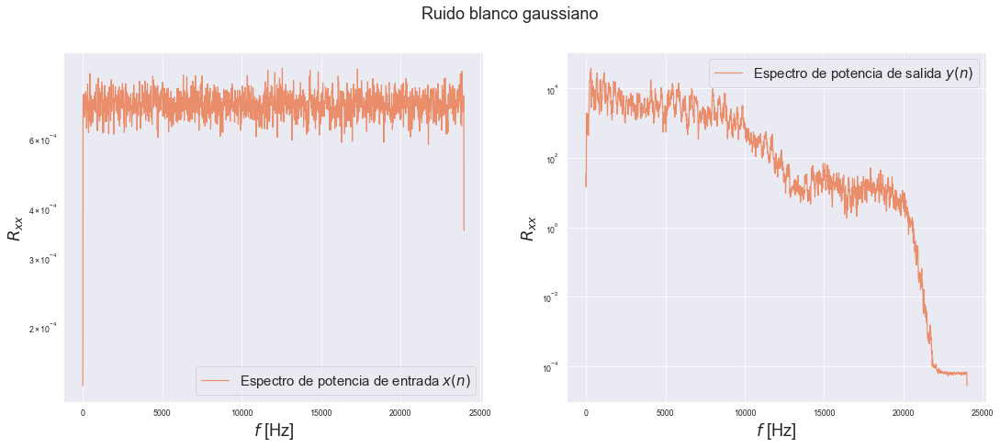

In [91]:
plot_periodograms(x_noise, y_noise, fs, 'Ruido blanco gaussiano')

## 2.2. Conclusiones
La señal que posea contenido espectral en un mayor rango de frecuencias audibles, será la que más información proveerá para estimar la respuesta al impulso de la habitación. Esto es porque se sabrá cómo responde la habitación ante estas frecuencias. Únicamente viendo los periodogramas, se puede decir que, tanto el barrido lineal de frecuencias como el ruido blanco gaussiano permitirán estimar adecuadamente la respuesta del sistema, ya que poseen contenido espectral para las frecuencias entre 20Hz y 20kHz.

Por otro lado, la señal del barrido lineal de frecuencias permite observar de forma más limpia el comportamiento del sistema a cada frecuencia, mientras que el ruido blanco gaussiano posee un espectro de amplitudes más amplio, y en todo instante el sistema estaría respondiendo a muchas frecuencias. Desde este punto de vista, la mejor estimación se puede hacer con el barrido lineal de frecuencias. 

# 3. Elección del modelo
Es necesario determinar el modelo matemático a emplear para la identificación de sistemas. Este modelo será un FIR o modelo de promedios móviles (moving average). En este caso, el modelo asume que el sistema sólo posee ceros, ya que sus polos se encuentran siempre en el origen. Así, el modelo se encuentra completamente parametrizado cuando se definen los coeficientes del mismo. Para esto, es necesario conocer cuántos coeficientes tiene el modelo, es decir, qué orden se utiliza.

Para esto, contando con x(n) e y(n), buscamos la respuesta al impulso $\textbf{h(n)}$ del sistema parlante-habitación-micrófono. El criterio de elección será por inspección del MSE mínimo $J_o$ como función de $M$.

El MSE mínimo se obtiene mediante:
\begin{equation}
J(\textbf{w}_o) = \sigma_y^2 - \textbf{p}^H\cdot \textbf{w}_o
\end{equation}
Donde:
$\textbf{w}_o = \textbf{R}^{-1}\cdot \textbf{p}$

In [92]:
from scipy import signal

In [93]:
from scipy import linalg

In [94]:
import time

In [148]:
def estimate_correlations(x, y):
    """ Estimates the autocorrelation function of the input signal and the cross correlation
        between the input signal and the desired response of the system.
        @param x Input signal x(n)
        @param y Desired response y(n)
        @return (rxx, rxy)
    """
    # Estimate the autocorrelation of the input signal
    rxx = signal.correlate(x, x, method='fft') / len(x)
    # Estimate the cross correlation between the input and the output signal
    rxy = signal.correlate(y, x, method='fft') / len(x)
    return rxx, rxy

In [149]:
def truncate_correlations(rxx, rxy, lags=None, one_sided=True):
    """ Truncates the autocorrelation and the cross correlation to use only the needed segments.
        @param rxx Estimation of the autocorrelation
        @param rxy Estimation of the cross correlation
        @param lags Amount of lags to each side (positive and negative) to be returned
        @param one_sided Whether it returns only the positive lags or both
        @return (rxx, rxy) Autocorrelation and cross correlation estimations
    """
    # Both estimations have been computed for negative and positive lags. According to what
    # is specified in the function arguments, either positive lags or both will be returned.
    # The following implementation was chosen to be easy to read rather than efficient in
    # amount of code lines.
    if one_sided:
        if lags is not None:
            rxx = rxx[rxx.argmax():rxx.argmax()+lags+1]
            rxy = rxy[len(rxy)//2-1:len(rxy)//2-1+lags+1]
        else:
            rxx = rxx[rxx.argmax():]
            rxy = rxy[len(rxy)//2-1:]
    else:
        if lags is not None:
            rxx = rxx[rxx.argmax()-lags:rxx.argmax()+lags+1]
            rxy = rxy[len(rxy)//2-1-lags:len(rxy)//2-1+lags+1]
        
    return rxx, rxy

In [150]:
def optimum_linear_estimator(x, y, order, rxx=None, rxy=None):
    """ Computes the coefficients for the optimum linear estimator using an estimation of
        the autocorrelation and the cross correlation. It also returns an estimation of the
        minimum MSE obtained with the optimum estimator (residual MSE).
        @param x Input signal x(n)
        @param y Desired response y(n)
        @param order Order of the linear estimator
        @param rxx Estimation of the autocorrelation
        @param rxy Estimation of the cross correlation
        @return (Jo, wo) Residual MSE and optimum coefficients
    """
    # Estimate the autocorrelation and the cross correlation
    if rxx is None or rxy is None:
        rxx, rxy = estimate_correlation(x, y, lags=(order-1), one_sided=True)
    
    # Create the autocorrelation matrix and estimate the variance of the desired response y(n)
    R = linalg.toeplitz(rxx)
    
    # Return the coefficients
    wo = np.dot(linalg.inv(R), rxy)
    Jo = y.var() - rxy.dot(wo)
    return Jo, wo

In [151]:
def run_order_analysis(x, y, orders):
    """ Calculates the optimum linear estimator coefficients for each of the given orders
        and estimates the power of the error. Returns the residual MSE and the execution time
        of each estimation.
        @param x Input signal x(n)
        @param y Desired response y(n)
        @param orders List of orders to be computed
    """
    # Input signal x(n) and desired response y(n) normalization
    x = x / x.max()
    y = y / y.max()

    # Compute the estimation of the autocorrelation and the cross correlation
    rxx, rxy = estimate_correlations(x, y)

    # Initialization of numpy arrays and selection of orders
    residuals = np.zeros(len(orders), dtype=np.float32)
    execution = np.zeros(len(orders), dtype=np.float32)

    for i, order in enumerate(orders):
        # Starting time of the execution
        start_time = time.time()

        # Compute the estimator
        rxx_truncated, rxy_truncated = truncate_correlations(rxx, rxy, lags=(order-1), one_sided=True)
        Jo, wo = optimum_linear_estimator(x, y, order, rxx=rxx_truncated, rxy=rxy_truncated)

        # Save the estimator results
        execution[i] = time.time() - start_time
        residuals[i] = Jo

        # Improve user experience, reduce anxiety!
        IPython.display.clear_output(wait=True)
        print(f'Progreso {np.round((i+1) / len(orders) * 100, 1)} %')

    print(f'Se estimaron los coeficientes de {len(orders)} órdenes en {execution.sum()} segundos')
    return residuals, execution

In [152]:
# Run the analysis for the linear sweep excitation
orders = [1, 2, 3, 4, 10, 20, 30, 40, 100, 200, 300, 400, 1000, 2000, 3000, 4000, 5000, 6000, 7000]
residuals, execution = run_order_analysis(
    x_linear_sweep, 
    y_linear_sweep,
    orders
)

Progreso 100.0 %
Se estimaron los coeficientes de 19 órdenes en 32.859130859375 segundos


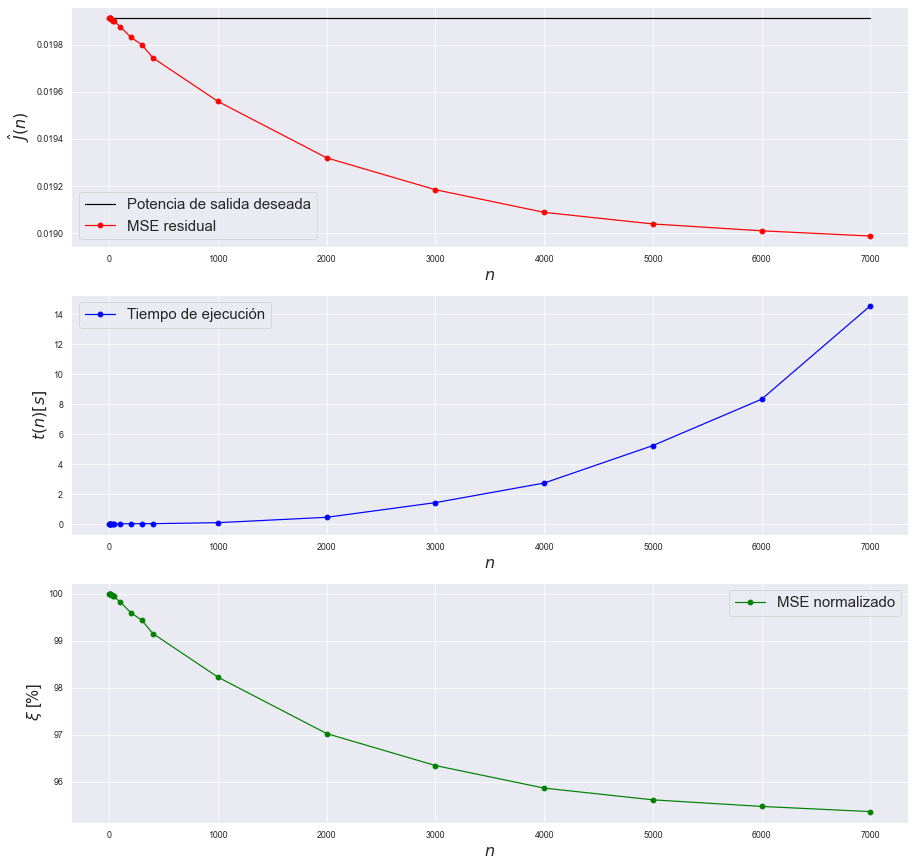

In [153]:
# Plot the results of the estimators
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(15, 15))

ax1.plot(orders, [(y_linear_sweep / y_linear_sweep.max()).var() for order in orders], color='black', label='Potencia de salida deseada')
ax1.plot(orders, residuals, marker='o', color='red', label='MSE residual')
ax1.set_ylabel('$\hat{J}(n)$', fontsize=16)
ax1.set_xlabel('$n$', fontsize=16)
ax1.legend(fontsize=15)
ax1.grid()

ax2.plot(orders, execution, marker='o', color='blue', label='Tiempo de ejecución')
ax2.set_ylabel('$t(n) [s]$', fontsize=16)
ax2.set_xlabel('$n$', fontsize=16)
ax2.legend(fontsize=15)
ax2.grid()

ax3.plot(orders, np.round(residuals / (y_linear_sweep / y_linear_sweep.max()).var() * 100, 2), marker='o', color='green', label='MSE normalizado')
ax3.set_ylabel('$\\xi$ [%]', fontsize=16)
ax3.set_xlabel('$n$', fontsize=16)
ax3.legend(fontsize=15)
ax3.grid()

plt.show()